<a href="https://colab.research.google.com/github/khairihr/MachineLearning/blob/main/Midterm%20Exam%20Task/UTS_ML_Support_Vector_Machine_Voice_Gender_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **UTS Machine Learning_Support Vector Machine_Gender Recognition by Voice**
* Nama: Khairi Hibatullah Ridho
* NIM: 1103228240
* Dataset: [*Voice Gender Recognition*](https://www.kaggle.com/datasets/primaryobjects/voicegender)
* Model: Support Vector Machine

# **Load dataset Voice Gender Recognition dari Google Drive**

Prompt: berikan saya kode untuk mount dari google drive ke google colab  '/Dataset MachineLearning/voice.csv' menggunakan pandas dan dataframe nya yaitu 'df'


Kegunaan dari Kode ini antara lain:
1. Import Libraries, google.colab digunakan untuk mengakses fungsi-fungsi khusus yang disediakan oleh Google Colab.
pandas adalah perpustakaan Python yang digunakan untuk manipulasi dan analisis data. (**from google.colab import drive
import pandas as pd**)

2. Mount Google Drive, Ini digunakan untuk mengakses Google Drive dari Google Colab.
Setelah dieksekusi, sebelum mengaksesnya nanti akan ada tautan yang diberikan dan memberikan izin untuk mengakses Google Drive. (**drive.mount('/content/gdrive')**)

3. Path ke File CSV di Google Drive, Ini adalah path menuju file CSV di Google Drive. **(file_path = '/content/gdrive/My Drive/Dataset MachineLearning/voice.csv')**

4. Membaca File CSV ke dalam DataFrame, Ini membaca file CSV dari path yang telah didefinisikan ke dalam DataFrame menggunakan pandas.
DataFrame adalah struktur data dua dimensi yang digunakan untuk menyimpan dan memanipulasi data. **(df = pd.read_csv(file_path))**

5. Tampilkan DataFrame, Ini mencetak lima baris pertama dari DataFrame untuk memastikan bahwa data telah berhasil dimuat dengan benar.
head() adalah metode pandas yang digunakan untuk menampilkan beberapa baris pertama dari DataFrame (secara default, lima baris). **print(df.head())**

Untuk Penjelasan tiap kolom dataset nya sendiri sebagai berikut:

1. index adalah Nomor identifikasi unik untuk setiap sampel dalam dataset. Ini adalah nilai yang disediakan oleh pandas untuk indeks baris.

2. meanfreq adalah Rata-rata frekuensi (dalam kHz) dari sinyal suara. Ini menggambarkan nilai tengah distribusi frekuensi suara.

3. sd adalah Standar deviasi dari frekuensi sinyal suara. Ini mengukur sejauh mana nilai frekuensi tersebar dari rata-ratanya.

4. median adalah Nilai tengah dari distribusi frekuensi suara. Ini adalah nilai frekuensi yang membagi distribusi menjadi dua bagian setara.

5. Q25 adalah Kuartil pertama dari distribusi frekuensi suara. Ini adalah nilai frekuensi yang membagi 25% data terendah dari yang lain.

6. Q75 adalah Kuartil ketiga dari distribusi frekuensi suara. Ini adalah nilai frekuensi yang membagi 75% data terendah dari yang lain.

7. IQR adalah Rentang interkuartil, yaitu selisih antara Q75 dan Q25. Ini memberikan ukuran variabilitas di antara data.

8. skew adalah Skewness dari distribusi frekuensi suara. Ini mengukur sejauh mana distribusi menyimpang dari simetri.

9. kurt adalah Kurtosis dari distribusi frekuensi suara. Ini mengukur sejauh mana distribusi lebih atau kurang tajam dibandingkan dengan distribusi normal.

10. sp.ent adalah Entropi spektral dari sinyal suara. Ini mengukur kompleksitas dan variasi informasi spektral.

11. sfm adalah Spread of Frequency Measure. Ini mengukur seberapa banyak energi frekuensi terkonsentrasi dalam sinyal suara.

12. mode adalah Modus dari distribusi frekuensi suara. Ini adalah nilai frekuensi yang memiliki frekuensi tertinggi dalam distribusi.

13. centroid adalah Frekuensi pusat massa dari distribusi frekuensi suara. Ini adalah titik tengah distribusi.

14. meanfun adalah Rata-rata dari frekuensi dasar suara. Ini berkaitan dengan tinggi atau rendahnya suara.

15. minfun adalah Durasi minimum dari frekuensi dasar suara. Ini adalah waktu minimum antara dua nilai frekuensi dasar.

16. maxfun adalah Durasi maksimum dari frekuensi dasar suara. Ini adalah waktu maksimum antara dua nilai frekuensi dasar.

17. meandom adalah Durasi rata-rata antara nilai-nilai frekuensi dasar. Ini mencerminkan variasi dalam durasi frekuensi dasar.

18. mindom adalah Durasi minimum dari frekuensi dasar suara. Ini adalah waktu minimum antara dua nilai frekuensi dasar.

19. maxdom adalah Durasi maksimum dari frekuensi dasar suara. Ini adalah waktu maksimum antara dua nilai frekuensi dasar.

20. dfrange adalah Rentang durasi dari frekuensi dasar suara. Ini adalah selisih antara maxdom dan mindom.

21. modindx adalah Indeks modulasi, yang mengukur seberapa banyak frekuensi dasar suara berfluktuasi sepanjang waktu.

22. label adalah Label jenis kelamin yang sesuai dengan sampel suara (misalnya, 'pria' atau 'wanita'). Ini adalah variabel target dalam tugas klasifikasi.

In [ ]:
from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Mount Google Drive
drive.mount('/content/gdrive')

# Path ke file CSV di Google Drive
file_path = '/content/gdrive/My Drive/Dataset MachineLearning/voice.csv'

# Membaca file CSV ke dalam DataFrame
df = pd.read_csv(file_path)

# Tampilkan DataFrame
df.head(5)

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male


## **Exploratory Data Analysis (EDA)**

Prompt: berikan penjelasan EDA itu apa kemudian lakukan Exploratory Data Analysist menggunakan kode dan berikan metode EDA yang tepat untuk mengolah dataset voice.csv


>Exploratory Data Analysis (EDA) adalah suatu proses analisis data untuk memahami karakteristik utama dari dataset. Tujuannya adalah untuk merinci pola, hubungan, dan sifat distribusi dalam dataset sebelum melakukan pemodelan lebih lanjut. EDA dapat melibatkan metode statistik dan visualisasi data.

In [ ]:
# Menampilkan informasi dari DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3168 entries, 0 to 3167
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   meanfreq  3168 non-null   float64
 1   sd        3168 non-null   float64
 2   median    3168 non-null   float64
 3   Q25       3168 non-null   float64
 4   Q75       3168 non-null   float64
 5   IQR       3168 non-null   float64
 6   skew      3168 non-null   float64
 7   kurt      3168 non-null   float64
 8   sp.ent    3168 non-null   float64
 9   sfm       3168 non-null   float64
 10  mode      3168 non-null   float64
 11  centroid  3168 non-null   float64
 12  meanfun   3168 non-null   float64
 13  minfun    3168 non-null   float64
 14  maxfun    3168 non-null   float64
 15  meandom   3168 non-null   float64
 16  mindom    3168 non-null   float64
 17  maxdom    3168 non-null   float64
 18  dfrange   3168 non-null   float64
 19  modindx   3168 non-null   float64
 20  label     3168 non-null   obje

Penjelasan Output:

1. Dataset 'df' memiliki 3168 baris dan 21 kolom.

2. Fitur numerik melibatkan statistik akustik suara seperti meanfreq, sd (standar deviasi), median, Q25, Q75, IQR (range interkuartil), skew, kurt (kurtosis), sp.ent (entropi spektral), sfm (spread of frequency measure), mode, centroid, meanfun, minfun, maxfun, meandom, mindom, maxdom, dfrange, dan modindx.

3. Target kategorikal adalah kolom "label" yang memuat informasi jenis kelamin (contoh: 'male' atau 'female').

In [ ]:
# Jumlah sampel per kelas
df['label'].value_counts()

male      1584
female    1584
Name: label, dtype: int64

Output: Menampilkan jumlah sampel untuk setiap kelas (jenis kelamin).

Prompt: Berikan kode untuk mengubah data semua male = 1 dan female = 0 di kolom 'label'

>Dengan mengganti 'male' menjadi 1 dan 'female' menjadi 0, kita memberikan representasi numerik yang konsisten dan mudah diinterpretasikan oleh model.

>Dalam beberapa kasus, model pembelajaran mesin, terutama dalam tugas klasifikasi biner, lebih mudah mengatasi angka 0 dan 1 untuk representasi kelas. Ini membantu dalam perhitungan dan interpretasi, serta memastikan bahwa model tidak terpengaruh oleh urutan nilai label yang tidak beraturan.

In [ ]:
# Mengubah male menjadi 1 dan female menjadi 0 pada kolom 'label'
df['label'].replace('male',1,inplace=True)
df['label'].replace('female',0,inplace=True)
df.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,1
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,1
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,1
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,1
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3168 entries, 0 to 3167
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   meanfreq  3168 non-null   float64
 1   sd        3168 non-null   float64
 2   median    3168 non-null   float64
 3   Q25       3168 non-null   float64
 4   Q75       3168 non-null   float64
 5   IQR       3168 non-null   float64
 6   skew      3168 non-null   float64
 7   kurt      3168 non-null   float64
 8   sp.ent    3168 non-null   float64
 9   sfm       3168 non-null   float64
 10  mode      3168 non-null   float64
 11  centroid  3168 non-null   float64
 12  meanfun   3168 non-null   float64
 13  minfun    3168 non-null   float64
 14  maxfun    3168 non-null   float64
 15  meandom   3168 non-null   float64
 16  mindom    3168 non-null   float64
 17  maxdom    3168 non-null   float64
 18  dfrange   3168 non-null   float64
 19  modindx   3168 non-null   float64
 20  label     3168 non-null   int6

Output: Sekarang untuk bagian label sudah berubah yang tadinya objek menjadi int64

In [ ]:
# Melakukan checking missing value
df.isnull().sum()

meanfreq    0
sd          0
median      0
Q25         0
Q75         0
IQR         0
skew        0
kurt        0
sp.ent      0
sfm         0
mode        0
centroid    0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
maxdom      0
dfrange     0
modindx     0
label       0
dtype: int64

Output: Tidak ada nilai yang hilang dari kolom-kolom ini

In [ ]:
# Ringkasan statistik deskriptif
df.describe()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
count,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,...,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000
mean,0.180907,0.057126,0.185621,0.140456,0.224765,0.084309,3.140168,36.568461,0.895127,0.408216,...,0.180907,0.142807,0.036802,0.258842,0.829211,0.052647,5.047277,4.994630,0.173752,0.500000
std,0.029918,0.016652,0.036360,0.048680,0.023639,0.042783,4.240529,134.928661,0.044980,0.177521,...,0.029918,0.032304,0.019220,0.030077,0.525205,0.063299,3.521157,3.520039,0.119454,0.500079
min,0.039363,0.018363,0.010975,0.000229,0.042946,0.014558,0.141735,2.068455,0.738651,0.036876,...,0.039363,0.055565,0.009775,0.103093,0.007812,0.004883,0.007812,0.000000,0.000000,0.000000
25%,0.163662,0.041954,0.169593,0.111087,0.208747,0.042560,1.649569,5.669547,0.861811,0.258041,...,0.163662,0.116998,0.018223,0.253968,0.419828,0.007812,2.070312,2.044922,0.099766,0.000000
50%,0.184838,0.059155,0.190032,0.140286,0.225684,0.094280,2.197101,8.318463,0.901767,0.396335,...,0.184838,0.140519,0.046110,0.271186,0.765795,0.023438,4.992188,4.945312,0.139357,0.500000
75%,0.199146,0.067020,0.210618,0.175939,0.243660,0.114175,2.931694,13.648905,0.928713,0.533676,...,0.199146,0.169581,0.047904,0.277457,1.177166,0.070312,7.007812,6.992188,0.209183,1.000000
max,0.251124,0.115273,0.261224,0.247347,0.273469,0.252225,34.725453,1309.612887,0.981997,0.842936,...,0.251124,0.237636,0.204082,0.279114,2.957682,0.458984,21.867188,21.843750,0.932374,1.000000


Output: Menampilkan statistik deskriptif untuk setiap kolom numerik seperti mean, median, dan lainnya.

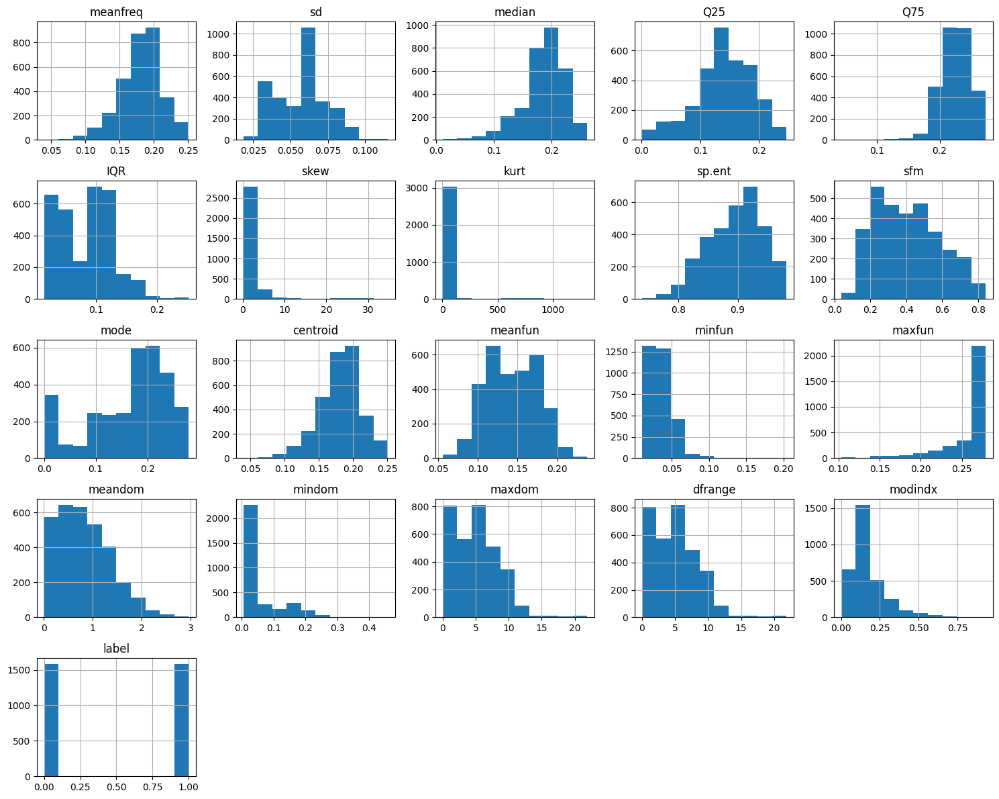

In [ ]:
# Histogram untuk semua fitur
df.hist(figsize=(15, 12))
plt.tight_layout()
plt.show()

Output: Menampilkan histogram untuk setiap fitur numerik, membantu memahami distribusi dan rentang nilai.

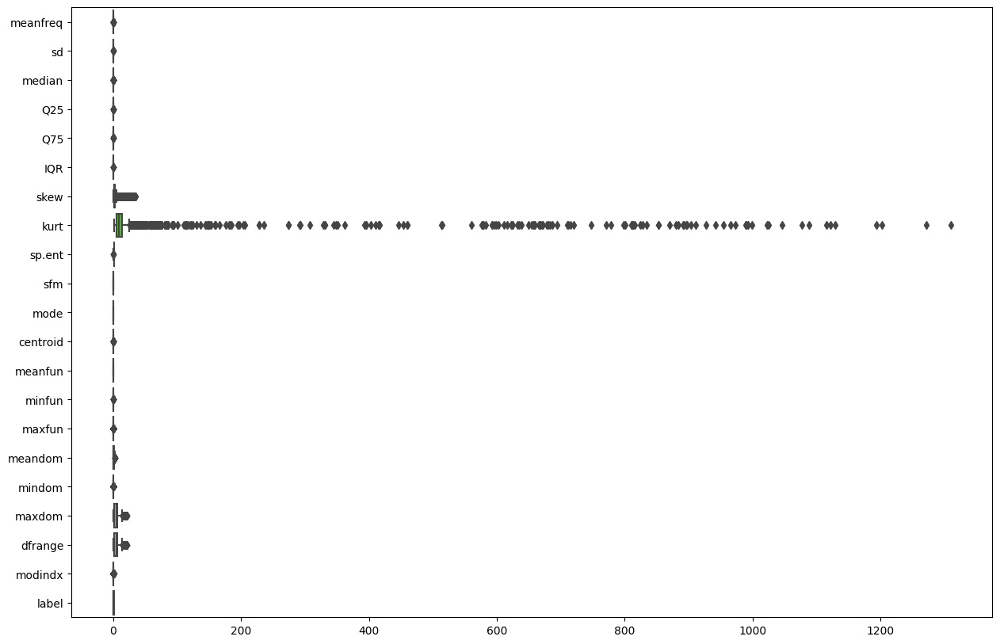

In [ ]:
# Box plot untuk setiap fitur
plt.figure(figsize=(15, 10))
sns.boxplot(data=df, orient='h')
plt.show()

Output: Menampilkan box plot untuk setiap fitur, membantu mendeteksi pencilan.

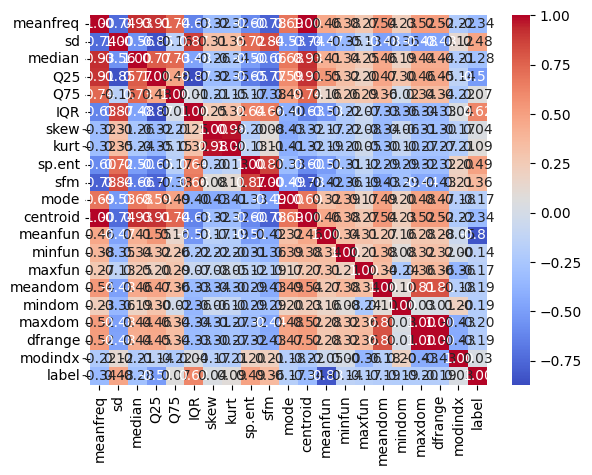

In [ ]:
# Matriks korelasi
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

Output: Menampilkan matriks korelasi antar fitur numerik, membantu melihat hubungan antar fitur.

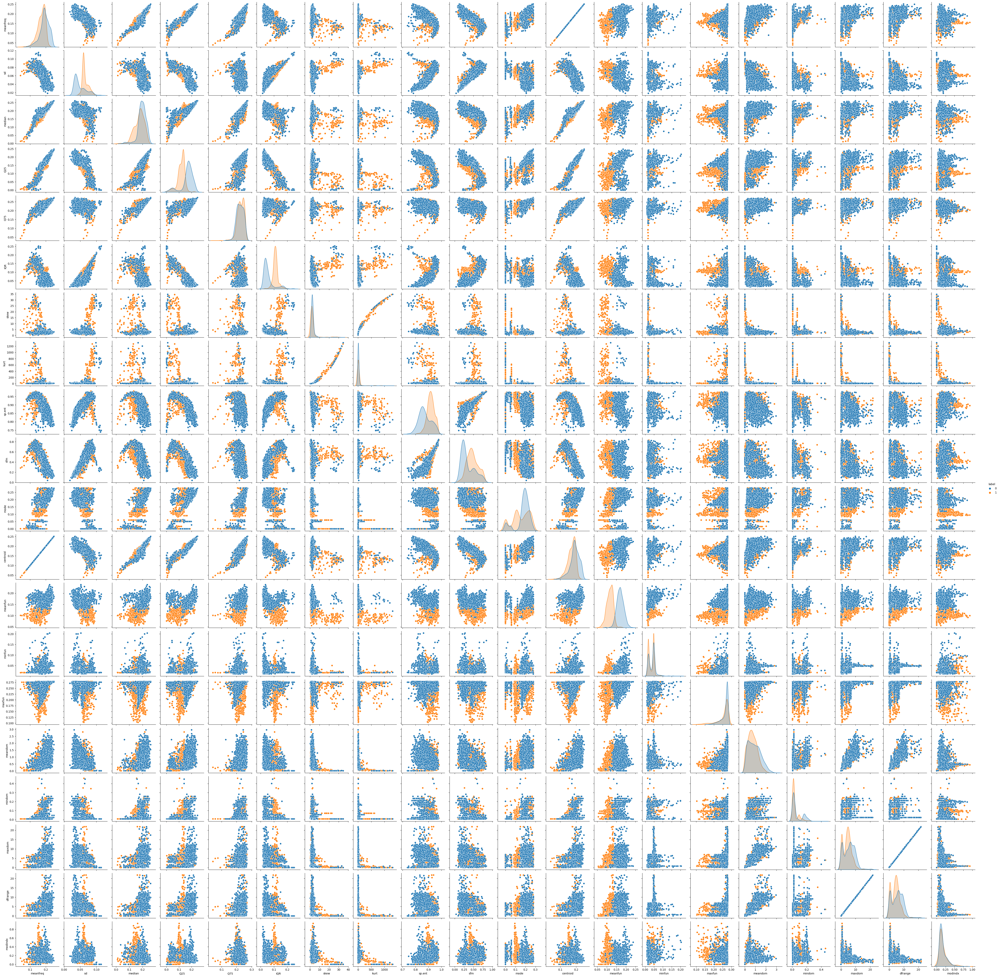

In [ ]:
# Scatter plot untuk fitur yang berpasangan
sns.pairplot(df, hue='label')
plt.show()

Output: Menampilkan scatter plot untuk melihat hubungan antara dua variabel.

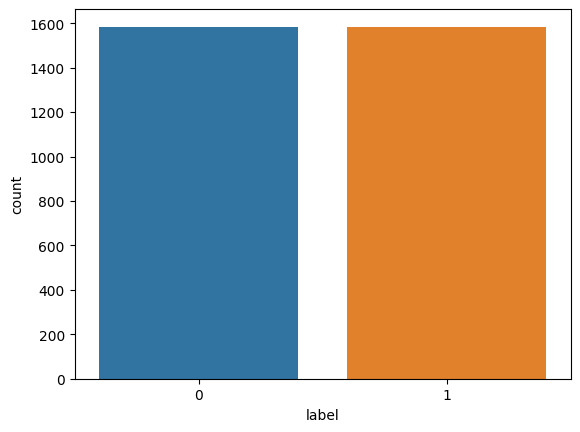

In [ ]:
# Diagram batang untuk distribusi kelas
sns.countplot(x='label', data=df)
plt.show()

Output: Menampilkan diagram batang untuk menunjukkan seimbang atau tidaknya kelas dalam variabel target ('label').

## Data Visualization (Visualisasi Data):

Prompt: Jelaskan apa Data Visualization itu dan juga buatkan beberapa kode untuk data visualization nya itu.

Data Visualization adalah representasi grafis dari informasi dan data. Ini melibatkan penggunaan elemen visual seperti grafik, grafik, dan peta untuk mempermudah pemahaman pola, tren, dan relasi dalam data.

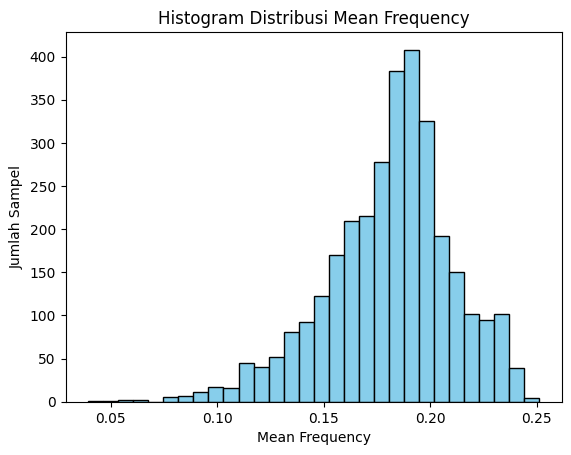

In [ ]:
import matplotlib.pyplot as plt

plt.hist(df['meanfreq'], bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram Distribusi Mean Frequency')
plt.xlabel('Mean Frequency')
plt.ylabel('Jumlah Sampel')
plt.show()

Output: Histogram yang menggambarkan distribusi frekuensi dari kolom 'meanfreq'.

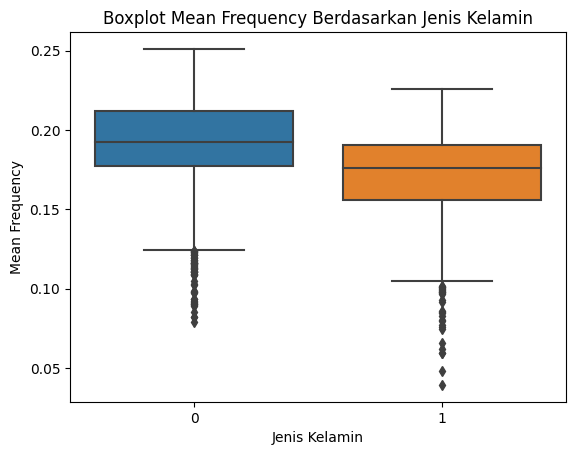

In [ ]:
sns.boxplot(x='label', y='meanfreq', data=df)
plt.title('Boxplot Mean Frequency Berdasarkan Jenis Kelamin')
plt.xlabel('Jenis Kelamin')
plt.ylabel('Mean Frequency')
plt.show()

Output: Box plot yang memvisualisasikan sebaran data 'meanfreq' berdasarkan jenis kelamin.

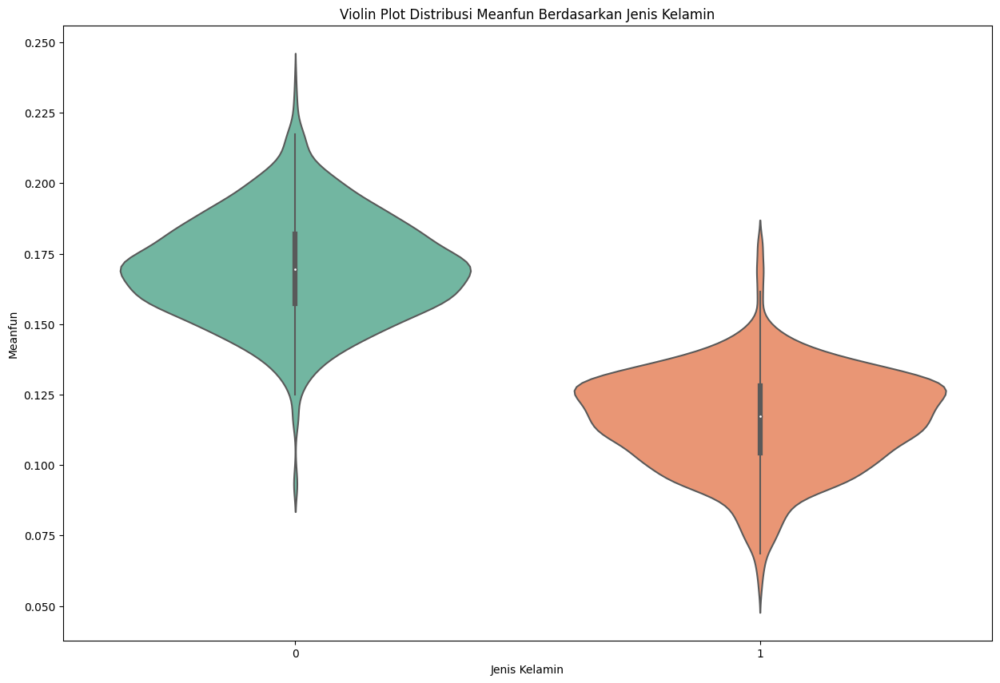

In [ ]:
plt.figure(figsize=(15, 10))
sns.violinplot(x='label', y='meanfun', data=df, palette='Set2')
plt.title('Violin Plot Distribusi Meanfun Berdasarkan Jenis Kelamin')
plt.xlabel('Jenis Kelamin')
plt.ylabel('Meanfun')
plt.show()

Output: Violin plot yang memvisualisasikan distribusi 'meanfun' berdasarkan jenis kelamin.

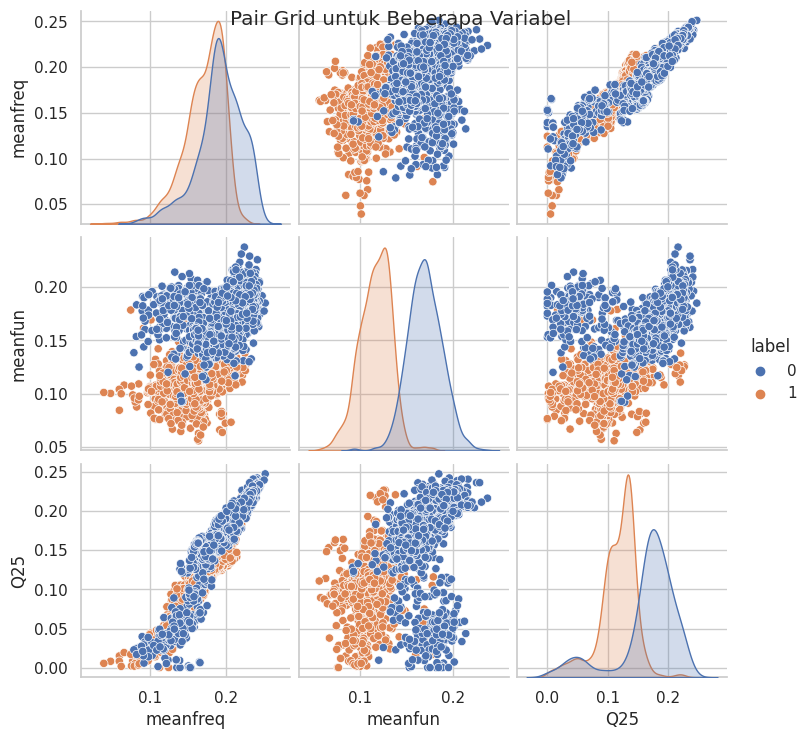

In [ ]:
sns.set(style='whitegrid')
sns.pairplot(df, hue='label', vars=['meanfreq', 'meanfun', 'Q25'])
plt.suptitle('Pair Grid untuk Beberapa Variabel')
plt.show()

Output: Pair grid untuk membandingkan distribusi beberapa variabel berdasarkan jenis kelamin.

## Training Support Vector Model

Training SVM bertujuan untuk menemukan hyperplane terbaik yang memaksimalkan margin antara dua kelas. Margin adalah jarak terpendek dari setiap sampel ke hyperplane. SVM juga dapat memanfaatkan kernel function untuk menangani kasus di mana data tidak dapat dipisahkan secara linier dalam ruang fitur asli.

## Memisahkan Datasetnya antara Fitur dan Target

> Prompt: buatkan kode untuk split dataset dengan fiturnya yaitu: [	'meanfreq',	'sd',	'median',	'Q25',	'Q75',	'IQR',	'skew',	 'kurt',	'sp.ent',	'sfm',	'mode',	'centroid',	'meanfun',	'minfun',	'maxfun',	'meandom',	'mindom',	'maxdom',	'dfrange',	'modindx'] dan untuk targetnya: 'label'


Pemisahan dataset antara fitur dan target adalah langkah awal dalam persiapan data untuk pembelajaran mesin. Fitur adalah variabel independen yang digunakan untuk membuat prediksi, sedangkan target adalah variabel dependen yang ingin diprediksi atau diklasifikasikan.

In [ ]:
from sklearn.model_selection import train_test_split
# Pemisahan fitur dan target
X = df[['meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'skew', 'kurt', 'sp.ent', 'sfm', 'mode', 'centroid', 'meanfun', 'minfun', 'maxfun', 'meandom', 'mindom', 'maxdom', 'dfrange', 'modindx']]
y = df['label']

# Pisahkan data testing dan training nya
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.7,random_state=42)
X_train

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
1318,0.185179,0.056132,0.198226,0.125767,0.227726,0.101959,1.791569,6.155855,0.895043,0.354815,0.195638,0.185179,0.125430,0.047761,0.274286,0.636161,0.023438,3.117188,3.093750,0.104895
3046,0.217378,0.053696,0.229773,0.207595,0.248363,0.040769,2.366549,9.160317,0.874846,0.302783,0.207595,0.217378,0.209385,0.028169,0.277778,0.554403,0.068359,0.825195,0.756836,0.354480
2136,0.183527,0.028682,0.182635,0.172387,0.195344,0.022958,3.115733,13.040747,0.819685,0.191933,0.181816,0.183527,0.173290,0.034043,0.231884,0.269420,0.164062,2.929688,2.765625,0.061815
2601,0.235974,0.031497,0.245181,0.216166,0.257755,0.041589,2.293486,8.318809,0.817122,0.126503,0.259206,0.235974,0.183131,0.050847,0.279070,1.790179,0.023438,10.265625,10.242188,0.150729
1772,0.171669,0.049640,0.177821,0.160741,0.196427,0.035686,3.358289,16.059178,0.877704,0.438459,0.181481,0.171669,0.159961,0.017978,0.262295,0.198893,0.007812,0.554688,0.546875,0.079503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3092,0.166738,0.052677,0.169427,0.162650,0.189223,0.026573,7.550412,76.134526,0.865282,0.427317,0.167465,0.166738,0.152651,0.022727,0.208333,0.174154,0.161133,0.214844,0.053711,0.136364
1095,0.198718,0.058959,0.217333,0.143111,0.252000,0.108889,1.116666,3.569725,0.917123,0.363369,0.227556,0.198718,0.139322,0.050473,0.279070,0.792092,0.023438,4.968750,4.945312,0.155766
1130,0.202333,0.063001,0.221946,0.137544,0.264817,0.127273,2.000371,6.681799,0.873847,0.261759,0.272855,0.202333,0.123610,0.047291,0.269663,1.190168,0.023438,7.429688,7.406250,0.093438
1294,0.181799,0.058102,0.192037,0.123670,0.225568,0.101897,1.091660,4.009295,0.925575,0.427947,0.190731,0.181799,0.110586,0.049741,0.274286,0.789062,0.023438,4.359375,4.335938,0.062312


Output:

X: DataFrame yang berisi fitur-fitur yang digunakan untuk melatih model.

y: Seri yang berisi target atau label yang ingin diprediksi atau diklasifikasikan.

## Training Dataset voice.csv
Prompt: berikan saya kode untuk training datasetnya menggunakan SVM Model

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

# Inisialisasi model SVM
svm_model = SVC(kernel='linear', random_state=42)

# Melatih model pada data training
svm_model.fit(X_train, y_train)

# Membuat prediksi pada data testing
y_pred = svm_model.predict(X_test)

# Evaluasi performa model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy:.2f}')
print('\nClassification Report:\n', report)

Accuracy: 0.89

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.81      0.88      1111
           1       0.84      0.97      0.90      1107

    accuracy                           0.89      2218
   macro avg       0.90      0.89      0.89      2218
weighted avg       0.90      0.89      0.89      2218



Output:

- svm_model: Model SVM yang telah diinisialisasi dengan kernel linear.
- svm_model.fit(): Proses pelatihan model SVM pada data training.
- y_pred: Hasil prediksi model pada data testing.
- accuracy: Akurasi model, persentase prediksi yang benar.
- report: Laporan klasifikasi yang mencakup presisi, recall, dan f1-score untuk setiap kelas.

## Evaluasi Model dan Dataset

1. Accuracy (Akurasi): Model SVM mencapai akurasi sebesar 89%, menunjukkan seberapa baik model dapat memprediksi kelas secara keseluruhan.

2. Precision (Presisi): Precision untuk label '0' (female) adalah 0.97, dan untuk label '1' (male) adalah 0.84. Precision mengukur seberapa banyak prediksi positif yang benar dari total prediksi positif.

3. Recall (Recall atau Sensitivitas): Recall untuk label '0' adalah 0.81, dan untuk label '1' adalah 0.97. Recall mengukur seberapa banyak dari total kelas yang benar telah diprediksi dengan benar oleh model.

4. F1-Score: F1-score adalah rata-rata harmonik antara precision dan recall. F1-score untuk label '0' adalah 0.88, dan untuk label '1' adalah 0.90.

5. Support: Support adalah jumlah sampel yang termasuk dalam setiap kelas. Support untuk label '0' adalah 1111, dan untuk label '1' adalah 1107.

6. Kesimpulan: Model SVM dengan kernel linear memberikan hasil evaluasi yang baik dengan akurasi tinggi. Meskipun terdapat perbedaan dalam precision dan recall antara kedua kelas, nilai F1-score yang tinggi menunjukkan keseimbangan antara precision dan recall. Evaluasi ini memberikan gambaran bagus tentang kemampuan model untuk mengklasifikasikan jenis kelamin berdasarkan fitur-fitur suara yang diberikan.

## Input Data Baru untuk Testing

In [ ]:
# Data baru
databaru = pd.DataFrame({
    'meanfreq': [0.1],
    'sd': [0.2],
    'median': [0.3],
    'Q25': [0.4],
    'Q75': [0.5],
    'IQR': [0.6],
    'skew': [0.7],
    'kurt': [0.8],
    'sp.ent': [0.9],
    'sfm': [0.2],
    'mode': [0.5],
    'centroid': [0.4],
    'meanfun': [0.6],
    'minfun': [0.3],
    'maxfun': [0.7],
    'meandom': [0.8],
    'mindom': [0.2],
    'maxdom': [0.9],
    'dfrange': [0.7],
    'modindx': [0.5]
})

# Prediksi label menggunakan model SVM
predicted_label = svm_model.predict(databaru)

# Tampilkan hasil prediksi
print(f'Predicted Label: {predicted_label[0]}')

# Mengambil nilai keputusan
decision_values = svm_model.decision_function(databaru)

# Menghitung probabilitas prediksi
prob_male = 1 / (1 + (2.718281828459045 ** -decision_values))
prob_female = 1 - prob_male

# Tampilkan hasil probabilitas prediksi
print(f'Probabilitas menjadi Perempuan: {prob_female[0]*100:.2f}%')
print(f'Probabilitas menjadi Laki-laki: {prob_male[0]*100:.2f}%')

Predicted Label: 0
Probabilitas menjadi Perempuan: 64.26%
Probabilitas menjadi Laki-laki: 35.74%


Penjelasan Rumus Probabilitasnya:

Rumus perhitungan probabilitasnya menggunakan fungsi sigmoid atau fungsi logistik. Fungsi sigmoid adalah fungsi matematis yang menghasilkan nilai dalam rentang (0, 1), dan rumusnya adalah:

P(Y = 1) = 1/1+e^-z

di mana:
- Y adalah variabel biner (0 atau 1),
- z adalah nilai keputusan (decision value) dari model.
- e adalah bilangan Euler, dan nilainya adalah 2.718281828459045

Untuk menggambarkan secara sederhana:
- Jika z positif besar, e^-z mendekati nol, sehingga P(Y = 1) mendekati 1  (prediksi kelas positif, dalam hal ini, pria).
- Jika z negatif besar, e^-z mendekati tak terhingga positif, sehingga P(Y = 1) mendekati 0 (prediksi kelas negatif, dalam hal ini, wanita).

Dalam konteks ini:

- decision_values adalah hasil dari fungsi decision_function, yang merupakan nilai linier dari model sebelumnya.
- prob_male adalah probabilitas prediksi menjadi laki-laki, dihitung dengan rumus sigmoid.
- prob_female adalah probabilitas prediksi menjadi perempuan, dihitung dengan rumus 1 - prob_male

Jadi, rumus tersebut mengonversi nilai keputusan yang bersifat kontinu menjadi probabilitas diskrit dalam rentang (0, 1), membuatnya lebih mudah untuk diinterpretasikan sebagai probabilitas kelas.

Penjelasan Output:

- Label yang Diprediksi: Hasil prediksi label untuk data baru (1 untuk laki-laki, 0 untuk perempuan).
- Probabilitas menjadi Perempuan: Persentase probabilitas data baru untuk menjadi Perempuan.
- Probabilitas menjadi Laki-laki: Persentase probabilitas data baru untuk menjadi Laki-laki.